In [4]:
import pandas as pd
from random import random
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from phq.de_utils.redshift import RedshiftDAO

In [27]:
USER_NAME = 'andrew'
PASSWORD = 'YRypYNGyv2tz'
ACCESS_TOKEN = '8uJCJ2nN6wD2FJE3SqOgSw7xeRXOBpMWD7fR6Dgd'

#3094
#440
#505
for store in [3094, 440]:        # [3094]: #, 440, 505]:

    Redshift = RedshiftDAO(redshift_username=USER_NAME,
                           redshift_password=PASSWORD,
                           redshift_db_name='phq_customers'
                          )
    # Loading SQL Query results into a pandas dataframe
    SQL_QUERY = f'''
        SELECT *
        FROM phq_customers.chipotle_raw.restaurant_demand_sales_by_store_20150101_20200731 rdsbs
        WHERE restaurantnumber = {store}
        '''
    sales_data = pd.read_sql_query(SQL_QUERY, Redshift.redshift_client)

    sales_data = sales_data[sales_data['channelhierarchylvl1name'] == 'in_store']
    
    sales_data['net_sales_new'] = sales_data['net_sales'] * 0.481
    sales_data = sales_data.sort_values('calendardate')

    # Sample from the normal distribution 
    # Add to sales.
    def add_noise(row):
        row['net_sales_new'] = row['net_sales_new'] + (np.random.normal()*sales_data['net_sales'].mean()*0.1)
        row['net_sales_new'] = abs(row['net_sales_new'])
        return row

    sales_data  = sales_data.apply(add_noise, axis=1)
    sales_data.drop(columns=['net_sales'], inplace=True)
    
    sales_data.to_csv(f'demand_data/sales_data_{store}.csv')
    

In [26]:
pd.read_csv('demand_data/sales_data_505.csv')

,Unnamed: 0,calendardate,restaurantnumber,channelhierarchylvl1name,net_sales_new
0,856,2015-01-02,505,in_store,2310.100150
1,1922,2015-01-03,505,in_store,1861.566952
2,3100,2015-01-04,505,in_store,2183.128014
3,6504,2015-01-05,505,in_store,1399.778023
4,1160,2015-01-06,505,in_store,1430.121993
...,...,...,...,...,...
1950,5260,2020-07-27,505,in_store,1272.295675
1951,458,2020-07-28,505,in_store,2279.908555
1952,2095,2020-07-29,505,in_store,1342.108185
1953,5496,2020-07-30,505,in_store,1067.351484


In [21]:
sales_data.head()

,calendardate,restaurantnumber,channelhierarchylvl1name,net_sales_new
856,2015-01-02,505,in_store,2393.194040
1922,2015-01-03,505,in_store,2288.666283
3100,2015-01-04,505,in_store,1518.723738
6504,2015-01-05,505,in_store,1054.786329
1160,2015-01-06,505,in_store,2482.808249


In [22]:
fig = make_subplots(rows=2,
                    cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.04)

fig.add_trace(go.Scatter(x=sales_data['calendardate'], y=sales_data['net_sales'],
                         mode='lines',
                         name='demand'),
                         row=1, col=1)

fig.add_trace(go.Scatter(x=sales_data['calendardate'], y=sales_data['net_sales_new'],
                         mode='lines',
                         name='demand_new'),
                         row=2, col=1)

fig.show()

KeyError: 'net_sales'

In [2]:
# store = 2433
# tv_data_file = 'lean_dataset_example.csv'
# df = pd.read_csv(tv_data_file)

In [3]:
df= pd.read_csv('demand_data/favor_sample.csv')

In [4]:
df.head()

,market_id,market_name,neighborhood_id,neighborhood_name,neighborhood_latitude,neighborhood_longitude,timestamp,ondemand_hours_worked,scheduled_hours_worked,total_hours_worked,favors_ordered,latlong
0,57,Tyler,79,Tyler,32.307733,-95.310172,2018-11-02 08:00:00,0.0000,0.00,0.0000,0.0,"(32.3077327849, -95.3101719358)"
1,57,Tyler,79,Tyler,32.307733,-95.310172,2018-11-02 09:00:00,0.0000,0.00,0.0000,0.0,"(32.3077327849, -95.3101719358)"
2,57,Tyler,79,Tyler,32.307733,-95.310172,2018-11-02 10:00:00,0.0000,0.00,0.0000,0.0,"(32.3077327849, -95.3101719358)"
3,57,Tyler,79,Tyler,32.307733,-95.310172,2018-11-02 11:00:00,3.9116,4.63,8.5416,17.0,"(32.3077327849, -95.3101719358)"
4,57,Tyler,79,Tyler,32.307733,-95.310172,2018-11-02 12:00:00,5.0580,6.00,11.0580,8.0,"(32.3077327849, -95.3101719358)"


In [5]:
df = df[['timestamp',
    'favors_ordered',
    'neighborhood_id']].rename(columns = {'favors_ordered': 'sales',
                                'neighborhood_id': 'sales_id'}).copy()

In [6]:
SALES_COL = 'sales'
DATE_COL = 'timestamp'

In [7]:
df['sales_id'].unique()

array([ 79, 149, 205, 279, 282, 290, 338, 336, 333, 324, 381, 343, 354,
       347, 353, 442, 435, 444, 369, 414, 383, 406])

In [10]:
df= df[df['sales_id'].isin([282, 414, 435, 383, 347])]

In [11]:
# Scale
new_name = SALES_COL + '_new'
df[SALES_COL + '_new'] = df[SALES_COL] * 0.481

df['sales_id'] = df['sales_id'] + (df['sales_id']*(np.random.random())).astype(int)

# Sample from the normal distribution 
# Add to sales.
def add_noise(row):
    row[SALES_COL + '_new'] = row[SALES_COL + '_new'] + (np.random.normal()*30)
    row[SALES_COL + '_new'] = abs(row[SALES_COL + '_new'])
    return row

df  = df.apply(add_noise, axis=1)

In [12]:
np.random.random()

0.4211932970900407

In [13]:
df.sort_values(DATE_COL, inplace=True)

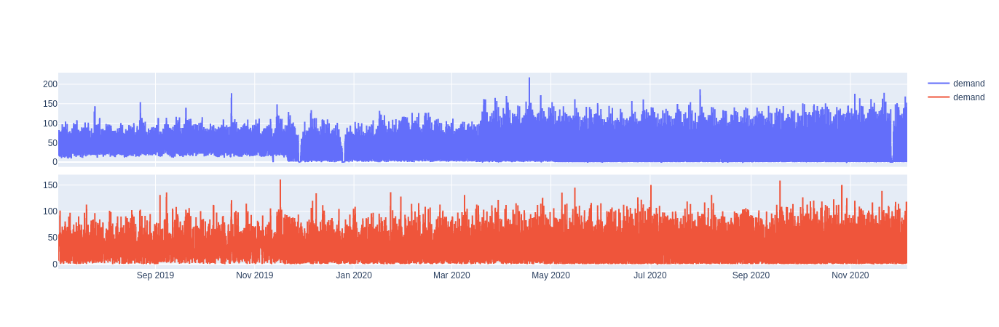

In [14]:
fig = make_subplots(rows=2,
                    cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.04)

fig.add_trace(go.Scatter(x=df[DATE_COL], y=df[SALES_COL],
                         mode='lines',
                         name='demand'),
                         row=1, col=1)

fig.add_trace(go.Scatter(x=df[DATE_COL], y=df[SALES_COL + '_new'],
                         mode='lines',
                         name='demand'),
                         row=2, col=1)

fig.show()

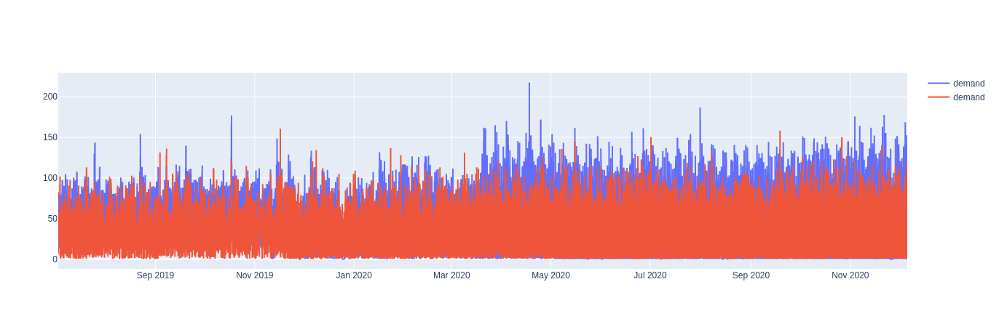

In [15]:
# Plot demand data
fig = go.Figure()
fig.add_trace(go.Scatter(x=df[DATE_COL], y=df[SALES_COL],
                         mode='lines',
                         name='demand'))

fig.add_trace(go.Scatter(x=df[DATE_COL], y=df[SALES_COL + '_new'],
                         mode='lines',
                         name='demand'))

fig.show()

In [16]:
df_new = df[[DATE_COL, SALES_COL + '_new', 'sales_id']].copy()

In [17]:
df_new = df_new.rename({DATE_COL:'date',
               SALES_COL + '_new':'sales'}, axis=1)

In [18]:
df_new.to_csv('demand_data.csv',index=False)

In [19]:
df = pd.read_csv('demand_data.csv')

In [20]:
df.head()

,date,sales,sales_id
0,2019-07-03 07:00:00,6.421962,447
1,2019-07-03 08:00:00,24.555160,447
2,2019-07-03 09:00:00,20.898615,447
3,2019-07-03 10:00:00,46.484273,447
4,2019-07-03 11:00:00,56.356120,447


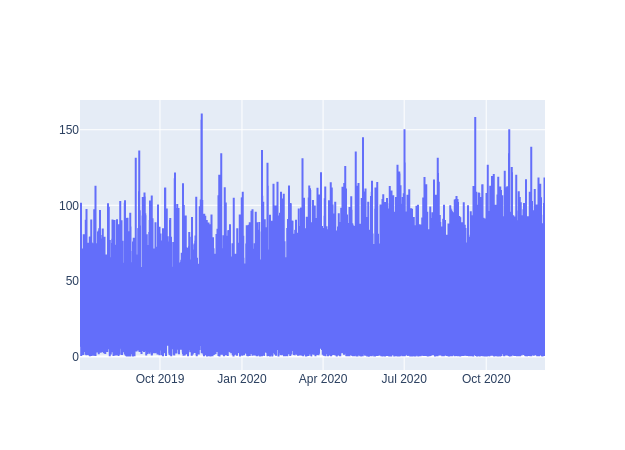

In [21]:
# Plot demand data
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['date'], y=df['sales'],
                         mode='lines',
                         name='demand'))


fig.show()